# Festive introduction to Genetic Algortihms - Finding the maximum of a function

<img src="https://github.com/EdgarsGarsneks/EdgarsGarsneks/blob/main/blog-resources/ga-function-max/images/thumb_elf.gif?raw=true" width="800" height="400" />

This notebook is a companion to the article Festive introduction to Genetic Algorithm - Treasure Hunting. Explaining basic concepts of GA and how they can be used to find the maximum of a function.


In [25]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

from IPython.display import HTML

## Problem statement

We have a function $H(x,y)$ that describes a landscape. We want to find the maximum of this function. Our search space is limited to $x=[-5;5]$ and $y=[-5;5]$. For demonstration purposes this function consists of multiple hills for which we need to find the highest one. Function defintion and visualization is shown below. With highest hill being at $(2,2)$

<img src="https://github.com/EdgarsGarsneks/EdgarsGarsneks/blob/main/blog-resources/ga-function-max/images/height_map.gif?raw=true" width="800" height="400" />


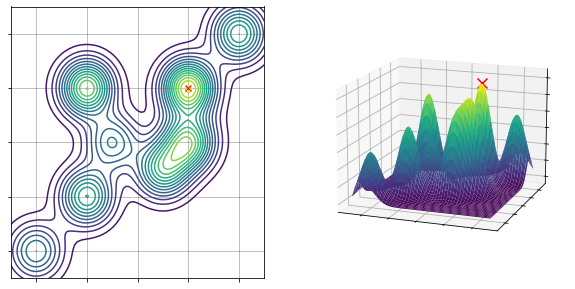

In [26]:
# Hill generation function
def h(x, y, dx = 0, dy = 0):
    return np.exp(-(x+dx)**2 - (y+dy)**2)

# Heightmap of the North Pole
def H(x, y):
    Z1 = h(x, y,-1,1)
    Z2 = h(x, y, -4, -4)
    Z3 = 1.5*h(x, y, -2, -2)  + 10
    Z4 = 1.3*h(x, y, 2, -2)
    Z5 = 0.7*h(x, y, 4, 4) + 1
    Z6 = h(x, y, 2, 2) - 5
    Z7 = 1.2*h(x, y, -2, 0) + 5
    Z8 = 0.7*h(x, y, 1, 0) + 3
    Z = (Z1 + Z2 + Z3 + Z4 + Z5 + Z6 + Z7 + Z8)*2

    return Z 

# Set bounds of the terrain
a = -5
b = 5
# Generate grid of x and y values
x = np.linspace(a, b, 100)
y = np.linspace(a, b, 100)
X, Y = np.meshgrid(x, y)

# Calculate height at each point
Z = H(X, Y)

# Function to plot terrain as a contour map
def plotCountourMap(ax):
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_xlim(0,5)
    ax.grid(c= 'k', alpha=0.3)
    ax.contour(x, y, Z, levels=15, cmap='viridis')
    ax.set_xlim(-5,5)
    ax.set_ylim(-5,5)
    ax.set_alpha(0)

def plot3dMap(ax, angle_x, angle_y):
    surf = ax.plot_surface(X, Y, Z, cmap='viridis')
    ax.view_init(angle_x, angle_y)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    ax.scatter(2,2,H(2,2), c='r', s=100, marker='x')
    return surf


fig = plt.figure(figsize=(10, 5))
ax = [fig.add_subplot(121), fig.add_subplot(122, projection='3d')]
# Plot countour map
plotCountourMap(ax[0])
ax[0].plot(2,2,'rx')
# Plot 3D map
plot3dMap(ax[1], 15, -70)

## Genetic Algorithm
Genetic Algorithm is a heuristic search algorithm inspired by the process of natural selection. It is used to find approximate solutions to optimization and search problems. It is based on the idea of evolution and natural selection. 

It starts with a population of random solutions and then uses selection, crossover, and mutation to evolve the population towards better solutions.

### 1. Defining individuals

Each solution (chromosome) in the population is called an individual which consists of string of genes. Genes are the parameters of the solution, in our case $x$ and $y$. Initial population should be generated randomly but for our demonstration purposes will start around single point $(-5,-5)$.

In [27]:
# To slow down the convergence of the algorithm, we limit initial elf placement to a small area
elf_starting_bounds = [[-5,-4.8], [-5,-4.8]] 

# Generates initial elf placement
def initial_solution():
    x = np.random.uniform(elf_starting_bounds[0][0], elf_starting_bounds[0][1])
    y = np.random.uniform(elf_starting_bounds[1][0], elf_starting_bounds[1][1])

    return x, y

### 2. Fitness function
After population of random solutions will be generated we need to evaluate how good each solution is. This is done by calculating the fitness of each individual. In our case fitness is the height of individual on the landscape.

<img src="https://github.com/EdgarsGarsneks/EdgarsGarsneks/blob/main/blog-resources/ga-function-max/images/elf_ranking.gif?raw=true" width="800" height="400" />

In [28]:
def fitness_function(chromosome):
    x, y = chromosome
    return H(x, y)

### 3. Selection
Selection is the process of selecting the fittest individuals from the population for reproduction. Fitter individuals have a higher chance of being selected for the next generation. There are multiple selection methods, for our demonstration purposes we will use roulette wheel selection. Where probability of selection is proportional to the fitness of the individual. 

<img src="https://github.com/EdgarsGarsneks/EdgarsGarsneks/blob/main/blog-resources/ga-function-max/images/roulete_wheel.gif?raw=true" width="800" height="400" />

In [29]:
def selection(population, fitness_values):
    total = np.sum(fitness_values)
    p = np.random.uniform(0, total)
    cumulative = 0

    for i in range(len(population)):
        cumulative += fitness_values[i]
        if cumulative > p:
            return population[i]
    return population[-1]  

### 4. Crossover
Crossover is the process of creating new individuals from the selected parents. It is done by exchanging genes between parents. There are multiple crossover methods, for our demonstration purposes we will use single point crossover, taking $x$ from one parent and $y$ from the other.

<img src="https://github.com/EdgarsGarsneks/EdgarsGarsneks/blob/main/blog-resources/ga-function-max/images/crossover.gif?raw=true" width="800" height="400" />

In [30]:
def crossover(parent1, parent2):
    x1, _ = parent1
    _, y2 = parent2

    return x1, y2

### 5. Mutation
Mutation is the process of introducing randomness to the population. It is done by changing the genes of the individual. Mutation helps to maintain genetic diversity in the population. For our demonstration purposes we will add a small random number to the individual.

<img src="https://github.com/EdgarsGarsneks/EdgarsGarsneks/blob/main/blog-resources/ga-function-max/images/mutation.gif?raw=true" width="800" height="400" />

It has two parameters to play around
- `mutation_rate` - probability of mutation happening to an gene
- `mutation_power` - how much to change the gene by

In [31]:
def mutation(chromosome, mutation_rate=0.3, mutation_power=0.5):
    x, y = chromosome    
    
    if np.random.rand() < mutation_rate:
       x += np.random.uniform(-mutation_power, mutation_power)
    if np.random.rand() < mutation_rate:
       y += np.random.uniform(-mutation_power, mutation_power)
    
    return np.clip(x, a, b) , np.clip(y, a, b)

### 6. Genetic Algorithm loop

Now that we have our building blocks we can put them together in a loop. We start with generating initial population, then we evaluate the fitness of each individual, select the fittest individuals, create new individuals by crossover, introduce randomness by mutation and repeat the process until we reach the maximum number of generations or the best individual is good enough.


In [32]:
def epoch(generations=100, population=[], sample_rate=50, sample_amount=1, elitism=0.1, population_size=100, mutation_power=0.5, mutation_rate=0.3, verbose=False):
    """
    Runs the genetic algorithm for a given number of generations.

    Parameters:
    generations (int): Number of generations to run the algorithm for
    population_size (int): Number of individuals in the population
    population (list): Initial population of solutions, if not provided, will be generated randomly, used to continue the algorithm from a previous run
    sample_rate (int): How often to sample the population results. Expressed in iterations.
    sample_amount (int): How many of the best individuals to sample and return
    elitism (float): Percentage of the population to keep as elite
    mutation_power (float): Maximum amount of mutation to apply to a gene

    Returns:
    list: List of tuples containing the generation number, best individuals (sample_amount), their fitness, best fitness and mean fitness
    """
    # List to store sampled results returned by the function
    samples = []
    # If population is not provided, generate a new one using initial_solution
    while len(population) < population_size:
        population.append(initial_solution())
    
    for it in range(generations):
        # Evaluate fitness of each individual
        fitness = [fitness_function(ind) for ind in population]
        # Sort population by fitness, in descending order
        sorted_by_fitness = [x for x in sorted(zip(fitness, population), reverse=True, key=lambda pair: pair[0])]
        
        fitness = [x[0] for x in sorted_by_fitness]
        population = [x[1] for x in sorted_by_fitness]

        # Sample the population and store the results
        if it % sample_rate == 0:
           if verbose:
            print(f"Generation {it}: Best {np.max(fitness)} Mean {np.mean(fitness)} Best individual {population[0:sample_amount]}")
           samples.append((it, population[0:sample_amount], fitness[0:sample_amount] , np.max(fitness), np.mean(fitness)))

        # Select elite to pass to the next generation
        number_of_elites = int(elitism * population_size)
        # Start next generation with elites
        new_population = population[:number_of_elites]

        # Fill the rest of the population
        while len(new_population) < population_size:
            # Select parents
            parent_a = selection(population, fitness)
            parent_b = selection(population, fitness)
            # Crossover
            child = crossover(parent_a, parent_b)
            # Mutation
            mutated_child = mutation(child, mutation_rate, mutation_power)
            new_population.append(mutated_child)
                
        population = new_population
    return samples

Now let's run the Genetic Algorithm to find the maximum of the function $H(x,y)$ and demonstrate how it works.

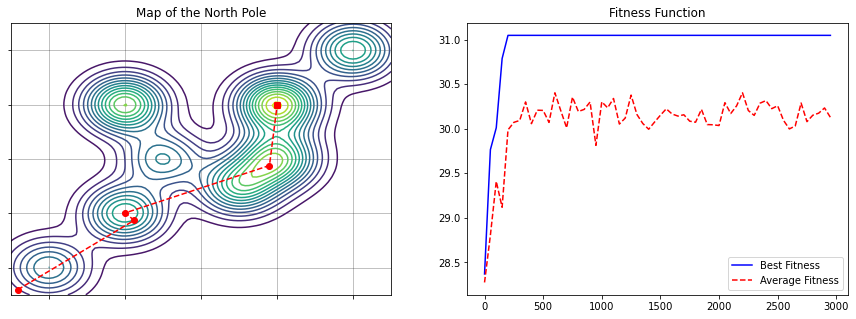

In [33]:
# Define the function to plot the results
def plotResults(results):
    """
    Plots the results of the genetic algorithm run.
    """
    fig, ax = plt.subplots(1, 2, figsize=(15, 5))

    plotCountourMap(ax[0])
    ax[0].plot(2,2,'rx')

    best = [x[1][0] for x in results]
    ax[0].plot([x[0] for x in best], [x[1] for x in best], 'ro--')    
    ax[0].set_title("Map of the North Pole")
    ax[0].plot(2,2,'rx')

    it = [x[0] for x in results]
    max_fitness = [x[3] for x in results]
    avg_fitness = [x[4] for x in results]

    ax[1].plot(it, max_fitness, 'b', label='Best Fitness')
    ax[1].plot(it, avg_fitness, 'r--', label='Average Fitness')
    ax[1].set_title("Fitness Function")
    ax[1].legend()

# Run the genetic algorithm
results = epoch(generations=3000, sample_rate=50, sample_amount=50, population_size=100, elitism=0.1, mutation_power=0.7, verbose=False)
plotResults(results)

And some animation

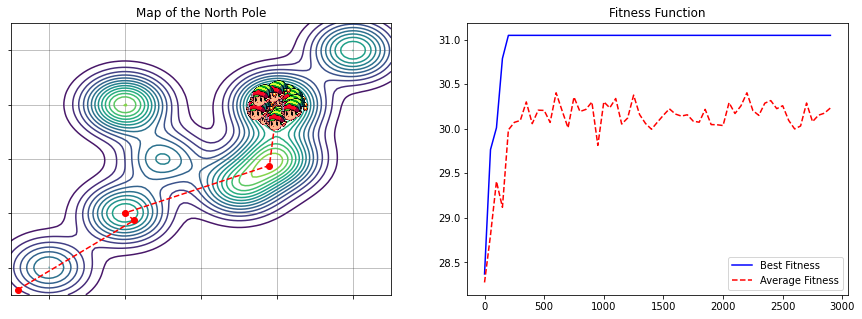

In [34]:
%matplotlib inline
def getImage(path,zoom=.1):
    return OffsetImage(plt.imread(path, format="png"), zoom=zoom)

icon = getImage("./images/elf.png", 0.2)
chest = getImage("./images/chests-03.png", 0.005)

matplotlib.rcParams['animation.embed_limit'] = 2**128

def animate(results):
    best = [x[1][0] for x in results]
    it = [x[0] for x in results]
    max_fitness = [x[3] for x in results]
    avg_fitness = [x[4] for x in results]

    def animate(i):
        x = [ x[0] for x in best[0:i]]
        y = [ x[1] for x in best[0:i]]
        ax[0].clear()
        plotCountourMap(ax[0])
        line = ax[0].plot(x, y, 'ro--')
        ax[0].set_xlim(a,b)
        ax[0].set_ylim(a,b)
        ax[0].set_title("Map of the North Pole")
        ax[0].plot(2,2,'rx')
        ax[0].add_artist(AnnotationBbox(chest, (2,2), frameon=False)) 
        elves = results[i][1]

        for elf in elves:
            ab = AnnotationBbox(icon, elf, frameon=False)
            ax[0].add_artist(ab)

        ax[1].clear() 
        ax[1].plot(it[0:i], max_fitness[0:i], 'b', label='Best Fitness') 
        ax[1].plot(it[0:i], avg_fitness[0:i], 'r--', label='Average Fitness')
        ax[1].set_title("Fitness Function")
        ax[1].legend()

        return line

    ani = animation.FuncAnimation(fig, animate, frames=len(best), blit=True)
    return HTML(ani.to_jshtml(fps=10))

fig, ax = plt.subplots(1, 2, figsize=(15, 5))
animate(results)